In [3]:
from ipfml.processing.segmentation import divide_in_blocks
from ipfml.processing import transform
from ipfml.filters import convolution as conv
from ipfml.filters import kernels
from ipfml import utils

from PIL import Image
from scipy import signal
from skimage import color
import scipy.stats as stats
import seaborn as sns
import cv2
import numpy as np
import matplotlib.pyplot as plt
from numpy.linalg import svd
import os

In [4]:
data_folder = "../dataset"

# Custom filters analysis

## Utils functions definition

In [5]:
def compute_images_path(dict_data):
    
    scene = dict_data['name']
    prefix = dict_data['prefix']
    indices = dict_data['indices']
    
    images_path = []
    for index in indices:
        path = os.path.join(data_folder, os.path.join(scene, prefix + index + ".png"))
        print(path)
        images_path.append(path)
    return images_path

In [6]:
def get_images_zones(dict_data, images_path):
    
    id_zone = dict_data['zone']
    
    zones_img = []
    for path in images_path:
        img = Image.open(path)
        zones = divide_in_blocks(img, (200, 200))
        zones_img.append(zones[id_zone])
        
    return zones_img

## Scenes information data

In [7]:
# start 00020 - ref 00900 - step 10
dict_appart = {'name': 'Appart1opt02', 
               'prefix': 'appartAopt_', 
               'indices': ["00050", "00100", "00200", "00300", "00400", "00500", "00700", "00900"],
               'zone': 9}

# start 00050 - ref 01200 - step 10
dict_cuisine = {'name': 'Cuisine01', 
               'prefix': 'cuisine01_', 
               'indices': ["00050", "00100", "00200", "00300", "00400", "00600", "00700","00900", "01200"],
               'zone': 6}

# start 00020 - ref 00950 - step 10
dict_sdb_c = {'name': 'SdbCentre', 
               'prefix': 'SdB2_', 
               'indices': ["00020", "00400", "00950"],
               'zone': 3}

# start 00020 - ref 00950 - step 10
dict_sdb_d = {'name': 'SdbDroite', 
               'prefix': 'SdB2_D_', 
               'indices': ["00020", "00400", "00950"],
               'zone': 3}

### Definition of parameters

In [8]:
images_path_appart = compute_images_path(dict_appart)
images_path_cuisine = compute_images_path(dict_cuisine)

../dataset/Appart1opt02/appartAopt_00050.png
../dataset/Appart1opt02/appartAopt_00100.png
../dataset/Appart1opt02/appartAopt_00200.png
../dataset/Appart1opt02/appartAopt_00300.png
../dataset/Appart1opt02/appartAopt_00400.png
../dataset/Appart1opt02/appartAopt_00500.png
../dataset/Appart1opt02/appartAopt_00700.png
../dataset/Appart1opt02/appartAopt_00900.png
../dataset/Cuisine01/cuisine01_00050.png
../dataset/Cuisine01/cuisine01_00100.png
../dataset/Cuisine01/cuisine01_00200.png
../dataset/Cuisine01/cuisine01_00300.png
../dataset/Cuisine01/cuisine01_00400.png
../dataset/Cuisine01/cuisine01_00600.png
../dataset/Cuisine01/cuisine01_00700.png
../dataset/Cuisine01/cuisine01_00900.png
../dataset/Cuisine01/cuisine01_01200.png


In [9]:
zones_appart = get_images_zones(dict_appart, images_path_appart)
zones_cuisine = get_images_zones(dict_cuisine, images_path_cuisine)

In [10]:
def display_filter_zones(zones, zones_dict, window, kernel):
    
    indices = zones_dict['indices']
    
    fig=plt.figure(figsize=(25, 15))
    columns = len(zones)
    
    row = 1
    for i in range(1, columns + 1):
        index = i - 1
        ax1 = fig.add_subplot(row, columns, i)
        plt.imshow(zones[index])
    
    row = 2
    for i in range(1, columns + 1):
        index = i - 1
        ax1 = fig.add_subplot(row, columns, i)
        l_img = transform.get_LAB_L(zones[index])
        diff = conv.convolution2D(l_img, kernel, window)
        diff = np.array(diff*255, 'uint8')
        ax1.title.set_text(str(indices[index]))
        plt.imshow(diff, cmap='gray', vmin=0, vmax=255)
    plt.show()
    

### Display `min_bilateral_filter` applications overview

Les seuils des zones utilisés dans le cadre de ces tests sont les suivants :
- Appart zone 9 : 00292
- Cuisine zone 6 : 00349

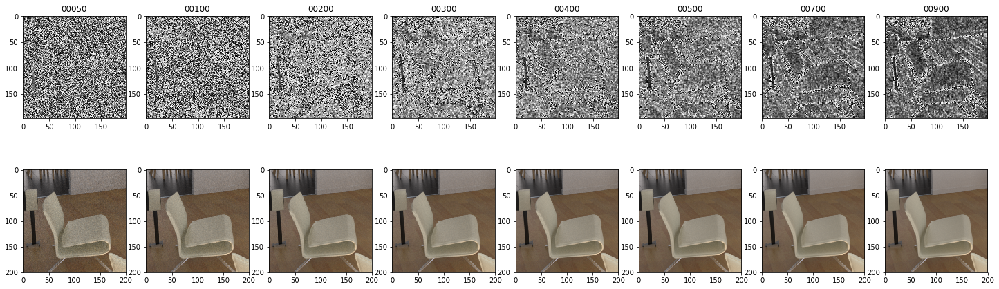

In [9]:
# on flat scene
zones = zones_appart
zones_dict = dict_appart
window = (3, 3)

display_filter_zones(zones, zones_dict, window, kernels.min_bilateral_diff)

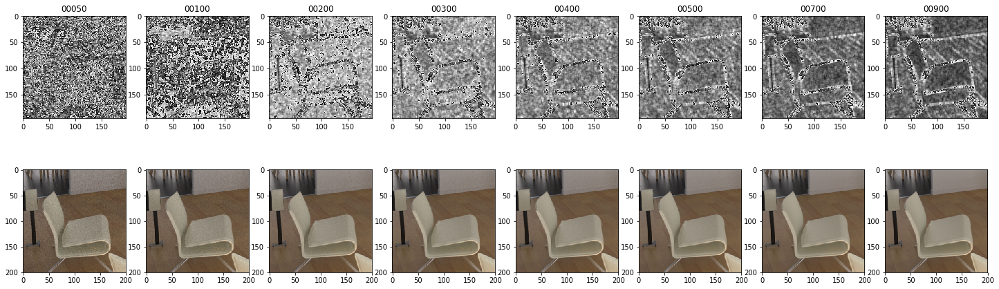

In [10]:
# on flat scene
zones = zones_appart
zones_dict = dict_appart
window = (5, 5)

display_filter_zones(zones, zones_dict, window, kernels.min_bilateral_diff)

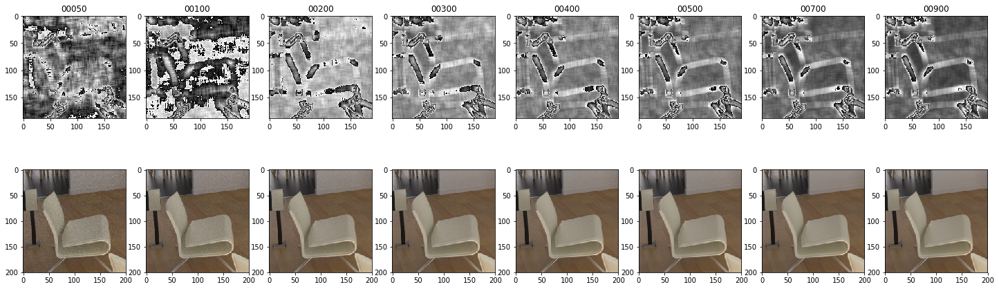

In [11]:
# on flat scene
zones = zones_appart
zones_dict = dict_appart
window = (11, 11)

display_filter_zones(zones, zones_dict, window, kernels.min_bilateral_diff)

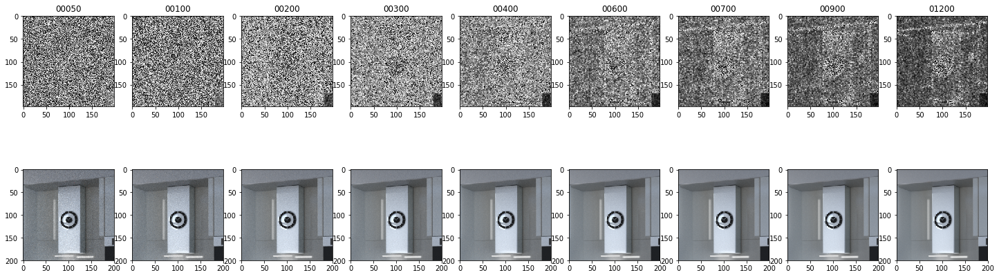

In [12]:
# on kitchen scene
zones = zones_cuisine
zones_dict = dict_cuisine
window = (3, 3)

display_filter_zones(zones, zones_dict, window, kernels.min_bilateral_diff)

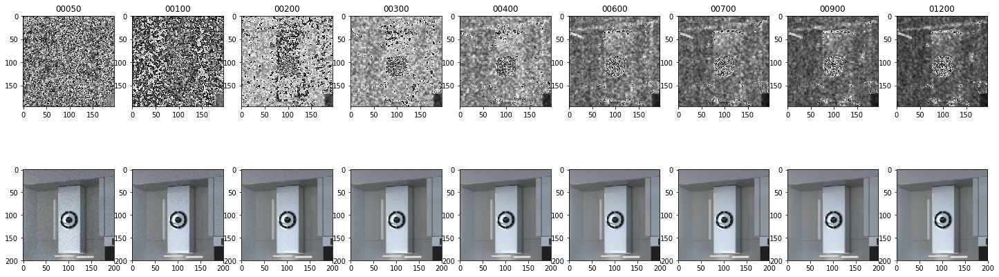

In [13]:
# on kitchen scene
zones = zones_cuisine
zones_dict = dict_cuisine
window = (5, 5)

display_filter_zones(zones, zones_dict, window, kernels.min_bilateral_diff)

### Display `plane_mean` applications overview

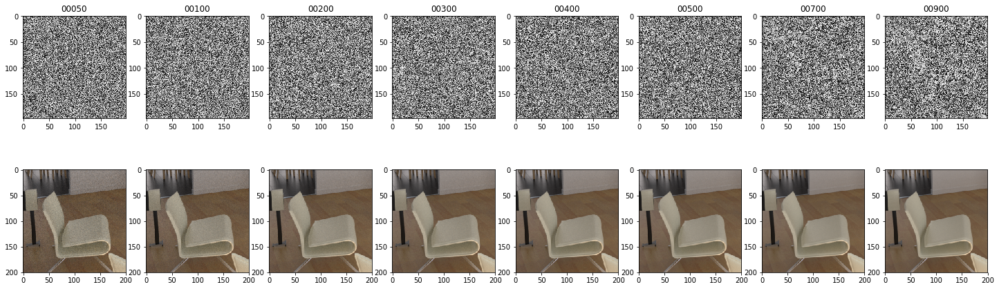

In [14]:
# on flat scene
zones = zones_appart
zones_dict = dict_appart
window = (3, 3)

display_filter_zones(zones, zones_dict, window, kernels.plane_mean)

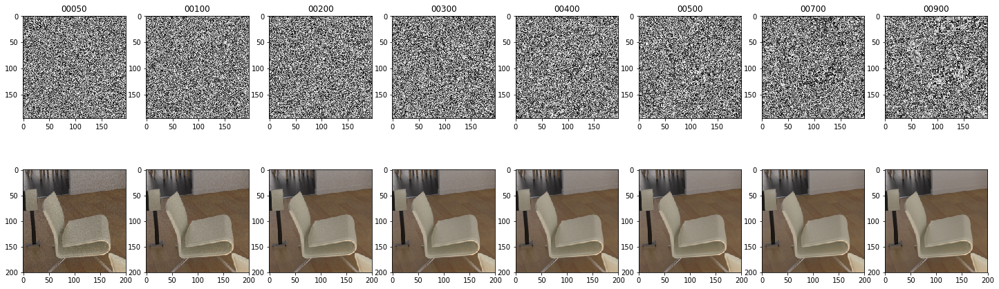

In [15]:
# on flat scene
zones = zones_appart
zones_dict = dict_appart
window = (5, 5)

display_filter_zones(zones, zones_dict, window, kernels.plane_mean)

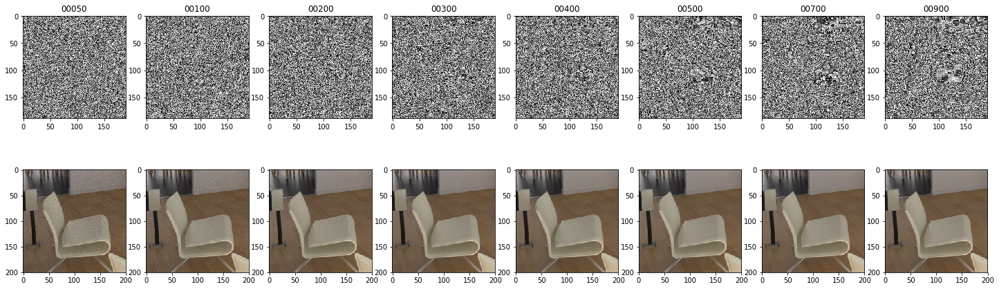

In [16]:
# on flat scene
zones = zones_appart
zones_dict = dict_appart
window = (11, 11)

display_filter_zones(zones, zones_dict, window, kernels.plane_mean)

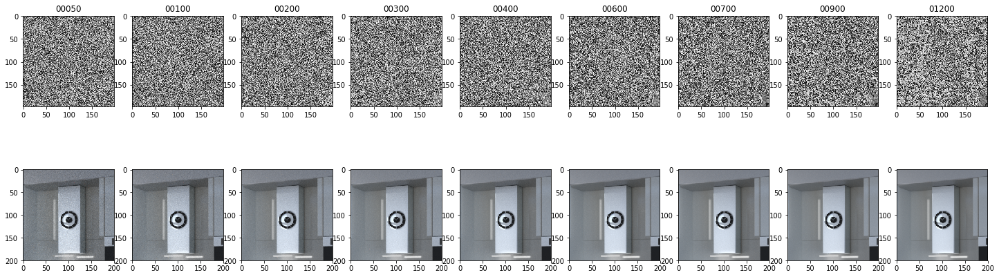

In [17]:
# on kitchen scene
zones = zones_cuisine
zones_dict = dict_cuisine
window = (3, 3)

display_filter_zones(zones, zones_dict, window, kernels.plane_mean)

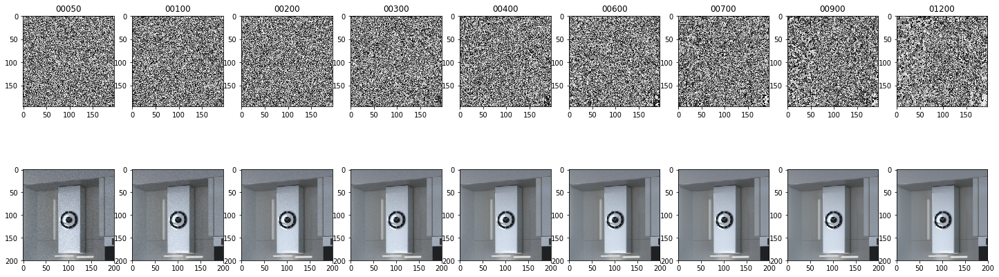

In [20]:
# on kitchen scene
zones = zones_cuisine
zones_dict = dict_cuisine
window = (5, 5)

display_filter_zones(zones, zones_dict, window, kernels.plane_mean)

### Display `plane_mean_max_error` applications overview

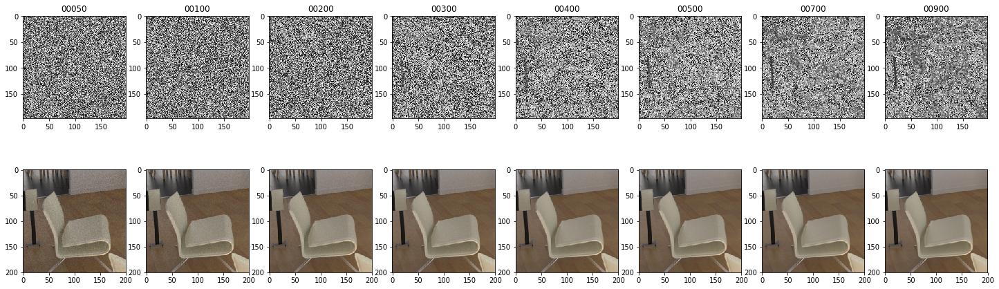

In [12]:
# on flat scene
zones = zones_appart
zones_dict = dict_appart
window = (3, 3)

display_filter_zones(zones, zones_dict, window, kernels.plane_max_error)

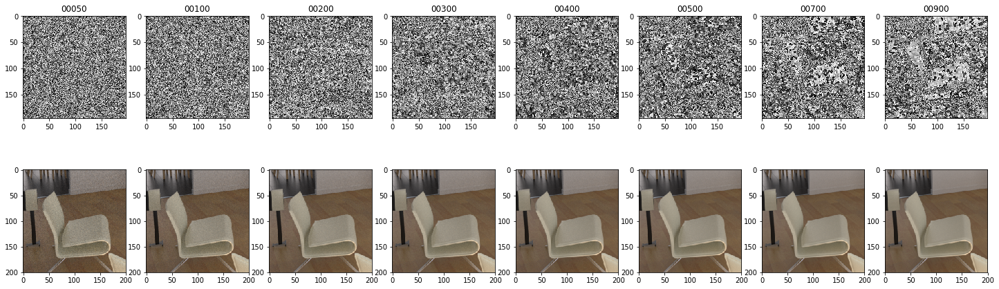

In [16]:
# on flat scene
zones = zones_appart
zones_dict = dict_appart
window = (5, 5)

display_filter_zones(zones, zones_dict, window, kernels.plane_max_error)

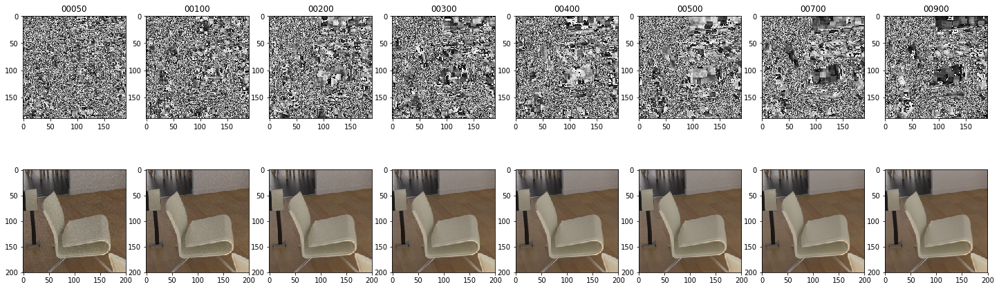

In [17]:
# on flat scene
zones = zones_appart
zones_dict = dict_appart
window = (11, 11)

display_filter_zones(zones, zones_dict, window, kernels.plane_max_error)

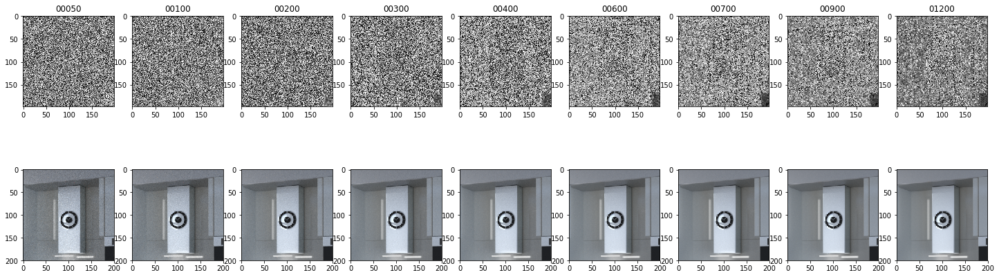

In [18]:
# on kitchen scene
zones = zones_cuisine
zones_dict = dict_cuisine
window = (3, 3)

display_filter_zones(zones, zones_dict, window, kernels.plane_max_error)

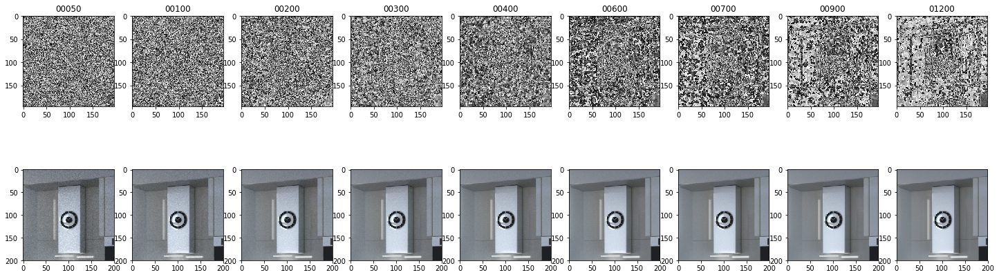

In [19]:
# on kitchen scene
zones = zones_cuisine
zones_dict = dict_cuisine
window = (5, 5)

display_filter_zones(zones, zones_dict, window, kernels.plane_max_error)

### Performance analysis

In [21]:
performance_test_zone = zones_appart[0]
l_img = transform.get_LAB_L(performance_test_zone)

#### `min_bilateral_diff`

In [39]:
%timeit conv.convolution2D(l_img, kernels.min_bilateral_diff, (3, 3))

2.27 s ± 29.3 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [40]:
%timeit conv.convolution2D(l_img, kernels.min_bilateral_diff, (5, 5))

5.97 s ± 36.8 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [41]:
%timeit conv.convolution2D(l_img, kernels.min_bilateral_diff, (11, 11))

27 s ± 198 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


#### `plane_mean`

In [42]:
%timeit conv.convolution2D(l_img, kernels.plane_mean, (3, 3))

14.5 s ± 425 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [43]:
%timeit conv.convolution2D(l_img, kernels.plane_mean, (5, 5))

14.6 s ± 341 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [44]:
%timeit conv.convolution2D(l_img, kernels.plane_mean, (11, 11))

20.5 s ± 272 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


#### `plane_max_error`

In [22]:
%timeit conv.convolution2D(l_img, kernels.plane_max_error, (3, 3))

16.6 s ± 2.46 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [23]:
%timeit conv.convolution2D(l_img, kernels.plane_max_error, (5, 5))

19 s ± 3.75 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [24]:
%timeit conv.convolution2D(l_img, kernels.plane_max_error, (11, 11))

26.1 s ± 6.04 s per loop (mean ± std. dev. of 7 runs, 1 loop each)
